<a href="https://colab.research.google.com/github/Naquivillagra/data-science/blob/main/PDI_TP.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Procesamiento de Imágenes - Diplodatos 2022

Trabajo Práctico

In [ ]:
integrantes = ["Ignacio Villagra Torcomian", "Marcelo Perea"]
print(*integrantes, sep="\n")


Ignacio Villagra Torcomian
Marcelo Perea


Importar las librerías necesarias

In [ ]:
import imageio
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

import cv2 


Abrir imágenes de demo incluídas en la biblioteca. Para evitar cargar desde disco, pueden utilizar estas imágenes para resolver el TP. Si utilizan otras adjuntarlas en la entrega para reproducibilidad.

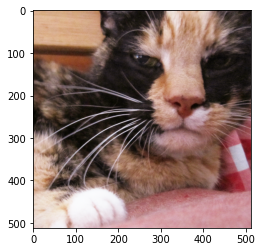

In [ ]:
img_1 = imageio.imread('imageio:wikkie.png')
plt.imshow(img_1)

# Otras imágenes (extraído de la documentación de imageio)

# bricks.jpg: A (repeatable) texture of stone bricks
# wood.jpg: A (repeatable) texture of wooden planks
# astronaut.png: Image of the astronaut Eileen Collins
# camera.png: A grayscale image of a photographer
# checkerboard.png: Black and white image of a chekerboard
# chelsea.png: Image of Stefan’s cat
# clock.png: Photo of a clock with motion blur (Stefan van der Walt)
# coffee.png: Image of a cup of coffee (Rachel Michetti)
# coins.png: Image showing greek coins from Pompeii
# horse.png: Image showing the silhouette of a horse (Andreas Preuss)
# hubble_deep_field.png: Photograph taken by Hubble telescope (NASA)
# immunohistochemistry.png: Immunohistochemical (IHC) staining
# moon.png: Image showing a portion of the surface of the moon
# page.png: A scanned page of text
# text.png: A photograph of handdrawn text
# wikkie.png: Image of Almar’s cat

# Ejercicio 1.1
La propuesta para esta actividad consiste en manipular independientemente la luminancia y la saturación de una imagen.
Para ello convertimos cada pixel de la imagen del espacio RGB al espacio YIQ, luego alteramos los valores de Y (para cambiar la luminancia) o de IQ (para cambiar la saturación).
Con los nuevos valores de YIQ, convertimos a RGB nuevamente y obtenemos una nueva imagen.

En primer lugar, vamos a importar una imagen

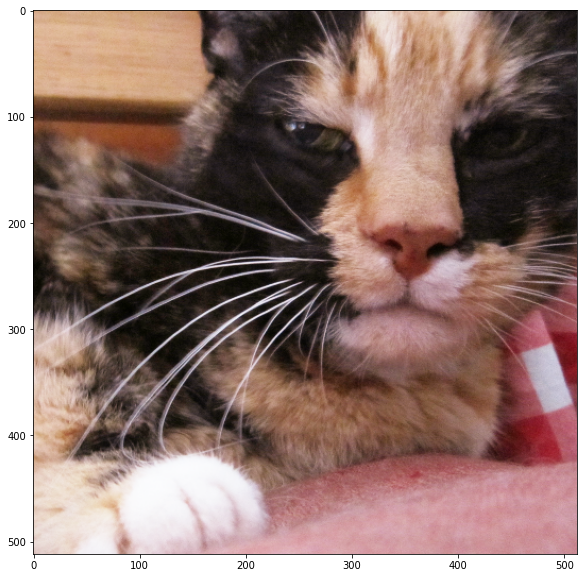

In [ ]:
img_1 = imageio.imread('imageio:wikkie.png')
plt.figure(figsize = (15,10))

plt.imshow(img_1)

In [ ]:
img_1.shape

(512, 512, 3)

Definimos una función para normalizar los valores de RGB del pixel

In [ ]:
def normalize(x):
    """
    Normalize a list of sample image data in the range of 0 to 1
    : x: List of image data.  The image shape is (32, 32, 3)
    : return: Numpy array of normalized data
    """
    return np.array((x - np.min(x)) / (np.max(x) - np.min(x)))

Definimos la función de conversión de RGB a YIQ

In [ ]:
RGB_TO_YIQ_MATRIX = np.array([[ 0.299, 0.587, 0.114], 
                          [ 0.595716, -0.274453, -0.321263], 
                          [ 0.211456, -0.522591, 0.311135]])
def rgb_to_yiq(img):
    yiq_img =  np.zeros((len(img),len(img[0]),len(img[0][0])))
    for i in range(len(img)):
        for j in range(len(img[i])):
            yiq_img[i][j] = RGB_TO_YIQ_MATRIX.dot(img[i][j])
    return yiq_img

Definimos la función para cambiar los valores de α  y  β

In [ ]:
def set_alpha_beta(img, alpha, beta):
    new_img = np.zeros((len(img),len(img[0]),len(img[0][0])))
    for i in range(len(img)):
        for j in range(len(img[i])):
            new_img[i][j][0] = alpha * img[i][j][0]
            if(new_img[i][j][0] > 1):
                new_img[i][j][0] = 1
            new_img[i][j][1] = beta * img[i][j][1]
            if(new_img[i][j][1] > 0.5957):
                new_img[i][j][1] = 0.5957
            elif new_img[i][j][1] < -0.5957:
                new_img[i][j][1] = -0.5957
            new_img[i][j][2] = beta * img[i][j][2]
            if(new_img[i][j][2] > 0.5226):
                new_img[i][j][2] = 0.5226
            elif new_img[i][j][2] < -0.5226:
                new_img[i][j][2] = -0.5226
    return new_img

Función de conversión de YIQ a RGB

In [ ]:
YIQ_TO_RGB_MATRIX = np.array([[1, 0.9663, 0.6210], 
                          [1, -0.2721, -0.6474], 
                          [1, -1.1070, 1.7046]])

def yiq_to_rgb(img):
    rgb_image =  np.zeros((len(img),len(img[0]),len(img[0][0])))
    for i in range(len(img)):
        for j in range(len(img[i])):
            rgb_image[i][j] = YIQ_TO_RGB_MATRIX.dot(img[i][j])
    return rgb_image

In [ ]:
def ej1_1(yiq_img, alpha, beta):
    new_yiq_img = set_alpha_beta(yiq_img, alpha, beta)
    plt.figure(figsize = (15,10))
    plt.imshow(yiq_to_rgb(new_yiq_img))
    plt.axis('off')
    plt.title("Alpha = " + str(alpha) + ", Beta = " + str(beta), fontweight='bold')
    plt.show()

**Una vez definidas las funciones anteriores, comenzamos con el procedimiento para la imagen que seleccionamos** 

In [ ]:
# 1) Normalizamos los valores de RGB del pixel
normalized_img = normalize(img_1)

In [ ]:
# 2) Pasamos de RGB al espacio YIQ
yiq_img = rgb_to_yiq(normalized_img)

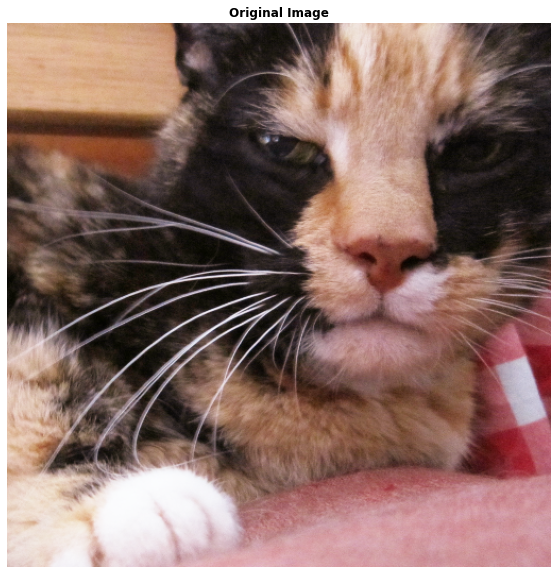

In [ ]:
# Ploteamos la imagen para mostrar que no hayy cambios en luminancia ni saturación
plt.figure(figsize = (15,10))
plt.imshow(yiq_to_rgb(yiq_img))
plt.axis('off')
plt.title('Original Image', fontweight='bold')
plt.show()

Ahora observaremos cómo se reduce la luminancia de la imagen a medida que reducimos el valor de alfa

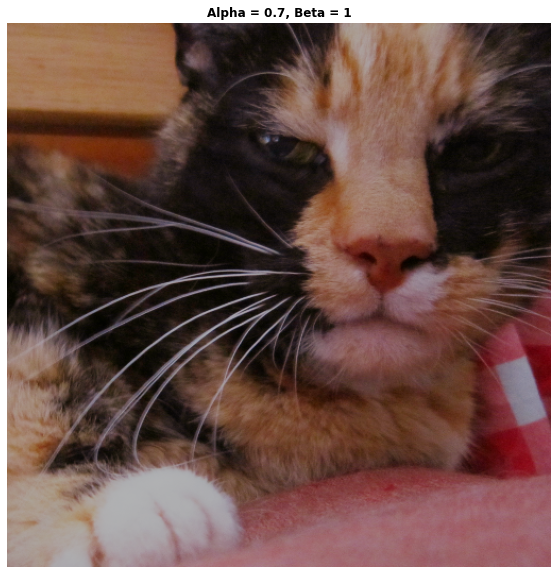

In [ ]:
alpha = 0.7
beta = 1
ej1_1(yiq_img, alpha, beta)

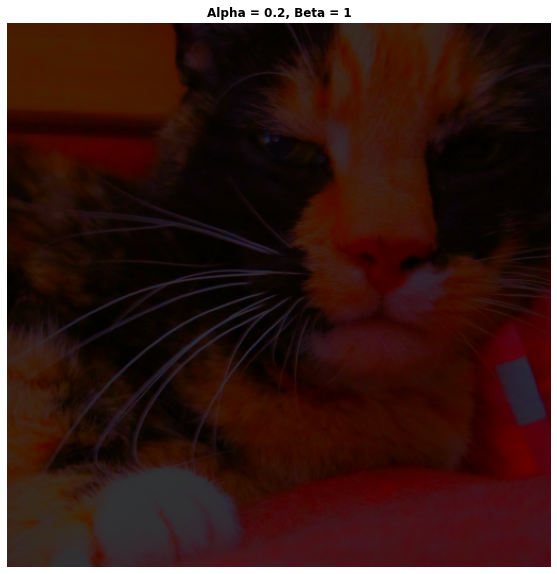

In [ ]:
alpha = 0.2
beta = 1
ej1_1(yiq_img, alpha, beta)

En contraposición, en las imágenes siguientes se puede observar cómo aumenta la luminanca para valores de alfa mayores que 1

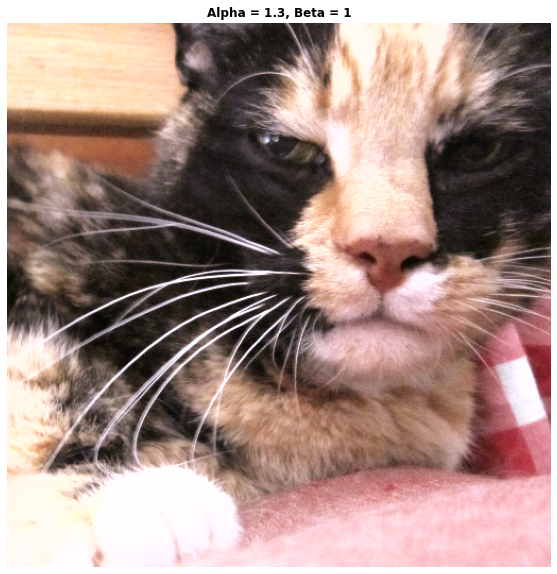

In [ ]:
alpha = 1.3
beta = 1
ej1_1(yiq_img, alpha, beta)

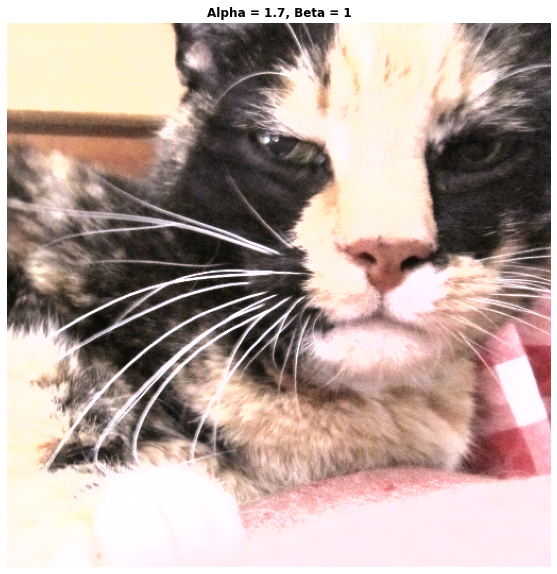

In [ ]:
alpha = 1.7
beta = 1
ej1_1(yiq_img, alpha, beta)

Realizamos un análisis similar para la saturación, modificando el valor de beta y manteniendo constante (e igual a 1) el valor de alfa. Se puede observar que para valores de beta menores a 1, disminuye la saturación

In [ ]:
alpha = 1
beta = 0.5
ej1_1(yiq_img, alpha, beta)

In [ ]:
alpha = 1
beta = 0
ej1_1(yiq_img, alpha, beta)

Aumentando el valor de beta, la saturación incrementa

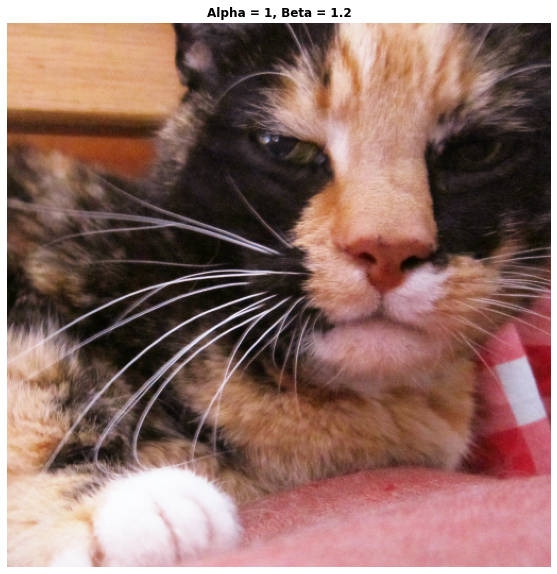

In [ ]:
alpha = 1
beta = 1.2
ej1_1(yiq_img, alpha, beta)

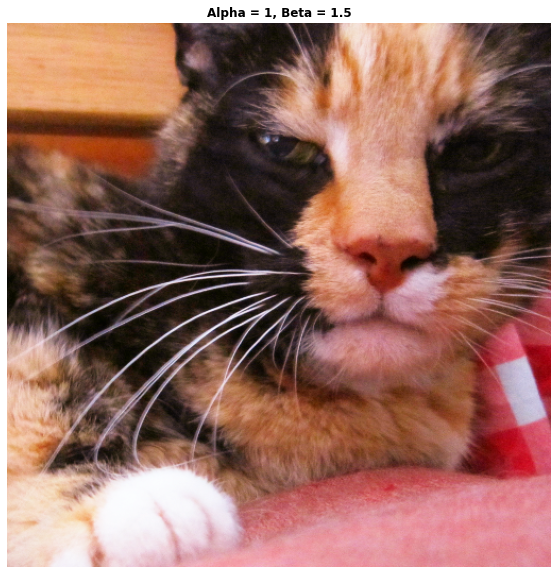

In [ ]:
alpha = 1
beta = 1.5
ej1_1(yiq_img, alpha, beta)

A continuación, observaremos cómo distintas combinaciones para los valores de alfa y beta se traducen en cambios en la imagen en cuanto a luminancia y saturación

In [ ]:
alpha = 2.5
beta = 1.5
ej1_1(yiq_img, alpha, beta)

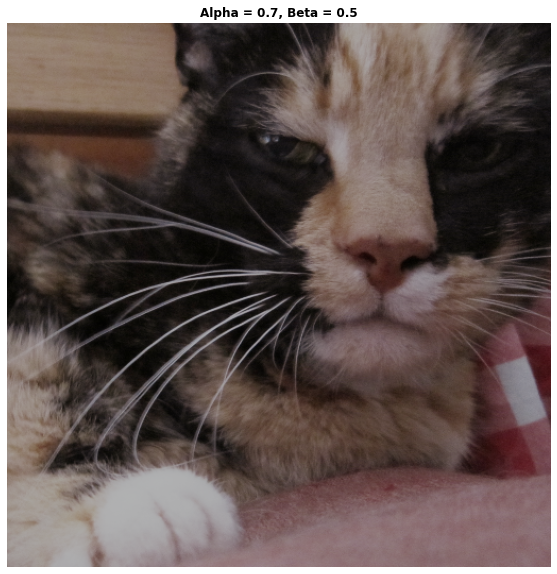

In [ ]:
alpha = 0.7
beta = 0.5
ej1_1(yiq_img, alpha, beta)

# Ejercicio 1.2
Desarrollar un aplicativo o notebook que pueda abrir una imagen, manipule su histograma de luminancias, y luego ver la imagen procesada. Se debe poder elegir filtro raíz, cuadrado, o lineal a trozos.
Los controles para elegir los filtros los organizan como les resulte más cómodo.

En primer lugar, vamos a dividir por 255 para normalizar la imagen

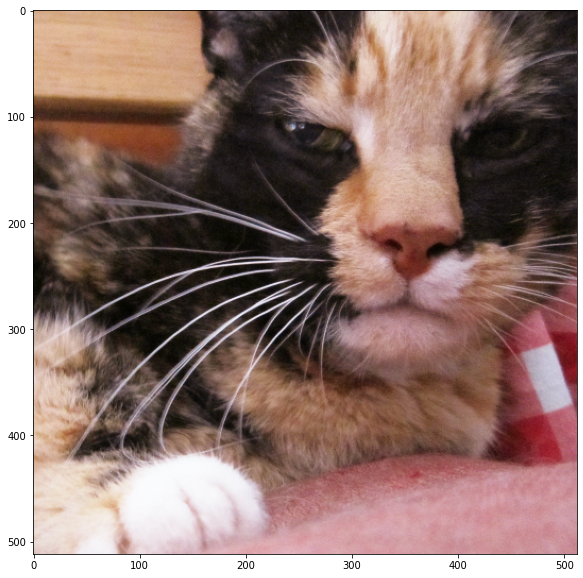

In [ ]:
img_2 = imageio.imread('imageio:wikkie.png') /255
plt.figure(figsize = (15,10))

plt.imshow(img_2)

In [ ]:
print(img_2.shape)

(512, 512, 3)


In [ ]:
def computar_v(img_rgb):
  r = img_rgb[:,:,0]
  g = img_rgb[:,:,1]
  b = img_rgb[:,:,2]

  v = np.maximum( r, np.maximum(g, b)) #podemos asumir que este canal "v" formado por los máximos de los canales r, g y b es la luminancia de la imagen que estamos considerando
  return v

Nos quedamos con la imagen en un solo canal (de máximos)

In [ ]:
v = computar_v(img_2)

print(v.shape)
print(v.min())
print(v.max())


(512, 512)
0.011764705882352941
0.996078431372549


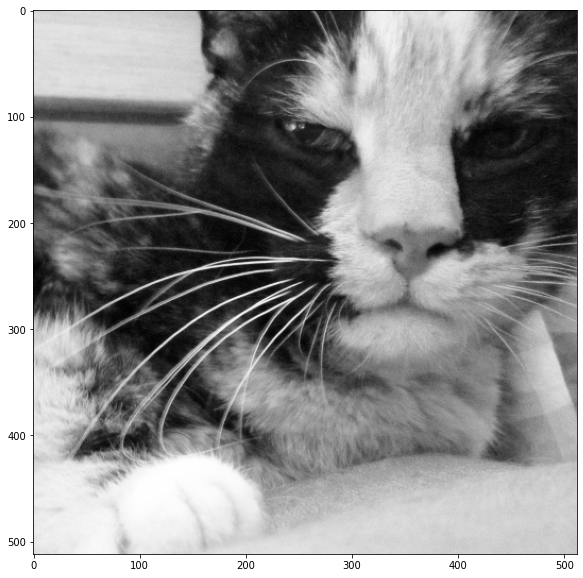

In [ ]:
# Graficamos lo que sería la imagen en un solo canal
plt.figure(figsize = (15,10))

plt.imshow(v, 'gray')

(array([19222., 35520., 20426., 18842., 25219., 29963., 22466., 28858.,
        46051., 15577.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <a list of 10 Patch objects>)

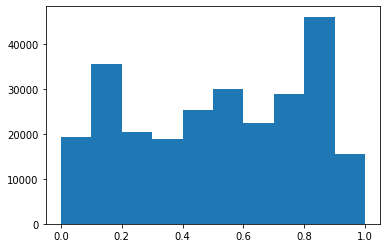

In [ ]:
# graficamos el histrograma de luminancias
plt.hist((v).flatten(), range=(0, 1))

Lo primero que podemos deducir del histrograma es que la imagen parece estar bastante distribuida entre pixeles claros y oscuros

Graficamos de nuevo tomando como parámetro 50 bins para ver de mejor manera la distribución. Aquí parece observarse de forma más clara que la imagen tiene una mayor proporción de pixeles claros. Esto tiene sentido considerando que las únicas partes oscuras de la imagen están dadas por el pelo oscuro del gato mientras que todo el resto tiene más color.

(array([   28.,   745.,  3096.,  6252.,  9101.,  9284.,  8189.,  7098.,
         6024.,  4925.,  4883.,  4047.,  3854.,  3718.,  3924.,  3721.,
         3674.,  3739.,  3810.,  3898.,  5045.,  4411.,  4953.,  5265.,
         5545.,  5836.,  6115.,  5586.,  5866.,  5506.,  5968.,  4693.,
         4545.,  3946.,  4368.,  4767.,  5020.,  5502.,  6168.,  7401.,
        12739., 12905.,  9430.,  7272.,  3705.,  3368.,  4235.,  3066.,
         2211.,  2697.]),
 array([0.  , 0.02, 0.04, 0.06, 0.08, 0.1 , 0.12, 0.14, 0.16, 0.18, 0.2 ,
        0.22, 0.24, 0.26, 0.28, 0.3 , 0.32, 0.34, 0.36, 0.38, 0.4 , 0.42,
        0.44, 0.46, 0.48, 0.5 , 0.52, 0.54, 0.56, 0.58, 0.6 , 0.62, 0.64,
        0.66, 0.68, 0.7 , 0.72, 0.74, 0.76, 0.78, 0.8 , 0.82, 0.84, 0.86,
        0.88, 0.9 , 0.92, 0.94, 0.96, 0.98, 1.  ]),
 <a list of 50 Patch objects>)

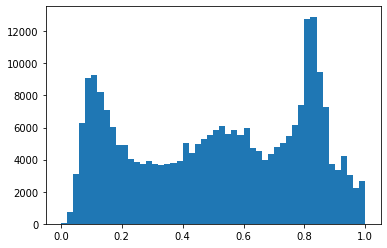

In [ ]:
plt.hist((v).flatten(), bins=50, range=(0, 1))

### Filtro de la raíz cuadrada

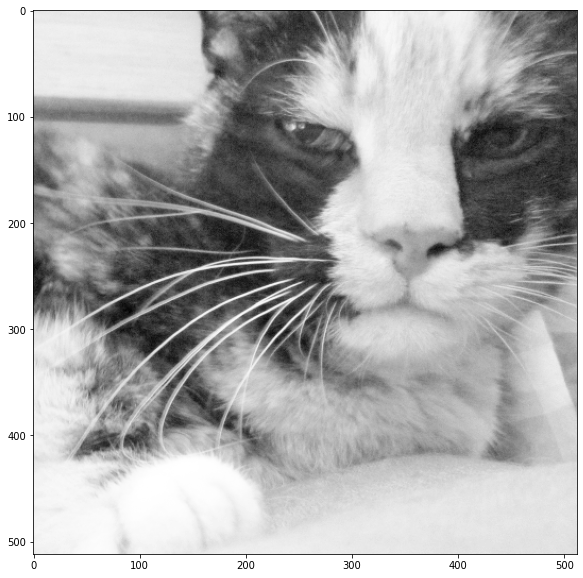

In [ ]:
v_raiz = np.sqrt(v)
plt.figure(figsize = (15,10))

plt.imshow(v_raiz, 'gray')


### Filtro de elevado al cuadrado

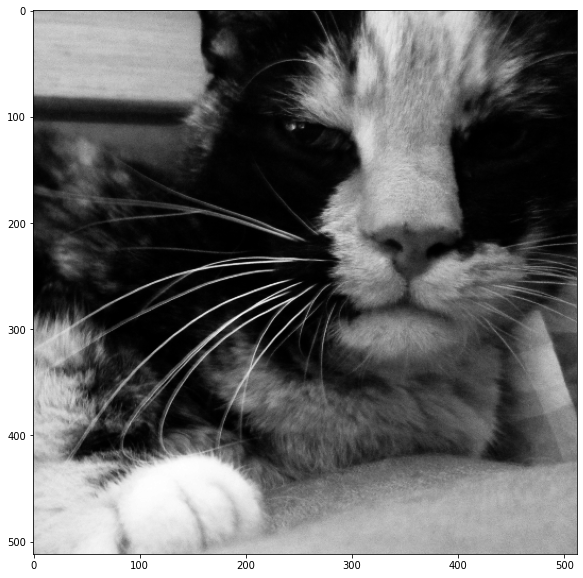

In [ ]:
v_2 = v*v
plt.figure(figsize = (15,10))

plt.imshow(v_2, 'gray')


### Filtro lineal

In [ ]:
def lineal_filter(img, correction):
    img *= correction
    return img

In [ ]:
img_lineal_filter = lineal_filter(v, 2)

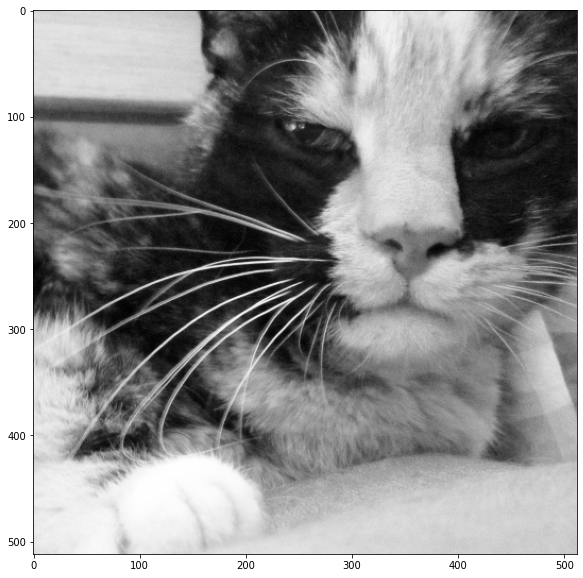

In [ ]:
plt.figure(figsize = (15,10))
plt.imshow(img_lineal_filter, 'gray')


# Otro procedimiento

Ahora realizaremos el mismo procedimiento pero considerando la imagen con colores y definiendo funciones para cada filtro

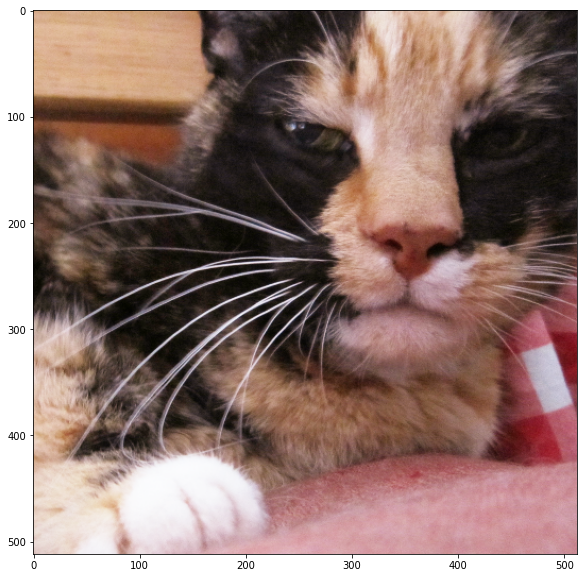

In [ ]:
img_12 = imageio.imread('imageio:wikkie.png')
plt.figure(figsize = (15,10))

plt.imshow(img_12)

Normalizamos la imagen utilizando la función definida en el ejercicio anterior y convertimos la imagen de RGB a YIQ

In [ ]:
img_normalized = normalize(img_12)
img_yiq = rgb_to_yiq(img_normalized)

In [ ]:
# Nos quedamos con el canal Y
def get_y_values_of_an_image(img):
    y_img = np.zeros((len(img),len(img[0])))
    for i in range(len(img)):
        for j in range(len(img[i])):
            y_img[i][j] = img[i][j][0]
    return y_img

In [ ]:
img_y = get_y_values_of_an_image(img_yiq)
img_y = np.float32(img_y)

Definimos las funciones para aplicar los filtros cuadrado, raíz y lineal

In [ ]:
def square_filter(img, correction):
    filtered_img = np.zeros((len(img),len(img[0])))
    for i in range(len(img)):
        for j in range(len(img[i])):
            filtered_img[i][j] = np.power(img[i][j], correction)
            if(filtered_img[i][j] > 1):
                filtered_img[i][j] = 1
    return filtered_img

In [ ]:
def square_root_filter(img, correction):  
    img = cv2.sqrt(img, correction)
    return img

In [ ]:
def lineal_filter(img, correction):
    img *= correction
    return img

In [ ]:
img_y_squared = square_filter(img_y, 2)
img_y_root_squared = square_root_filter(img_y, 2)
img_y_lineal_filter = lineal_filter(img_y, 2)

In [ ]:
def replace_y_values_in_an_image(original_image, y_image):
    image_replaced = np.zeros((len(original_image),len(original_image[0]),len(original_image[0][0])))
    for i in range(len(original_image)):
        for j in range(len(original_image[i])): 
            image_replaced[i][j][0] = y_image[i][j]
            image_replaced[i][j][1] = original_image[i][j][1]
            image_replaced[i][j][2] = original_image[i][j][2]
    return image_replaced

In [ ]:
img_squared_yiq = replace_y_values_in_an_image(img_yiq, img_y_squared)
img_root_squared_yiq = replace_y_values_in_an_image(img_yiq, img_y_root_squared)
img_lineal_filter_yiq = replace_y_values_in_an_image(img_yiq, img_y_lineal_filter)

### Filtro elevado al cuadrado

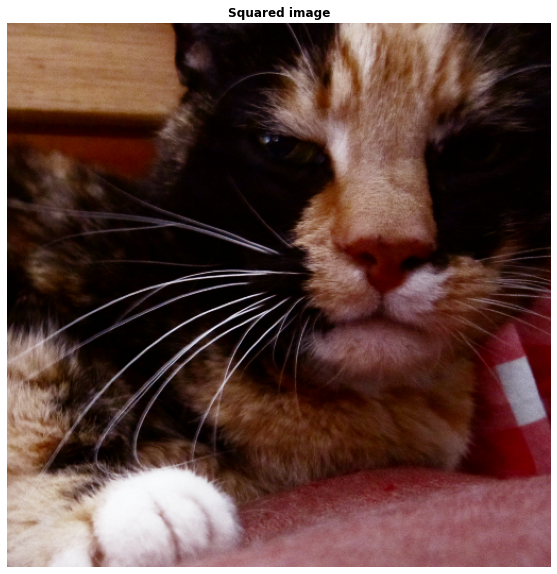

In [ ]:
plt.figure(figsize = (15,10))
plt.imshow(yiq_to_rgb(img_squared_yiq))
plt.title('Squared image', fontweight='bold')
plt.axis('off')
plt.show()

### Filtro raíz cuadrada

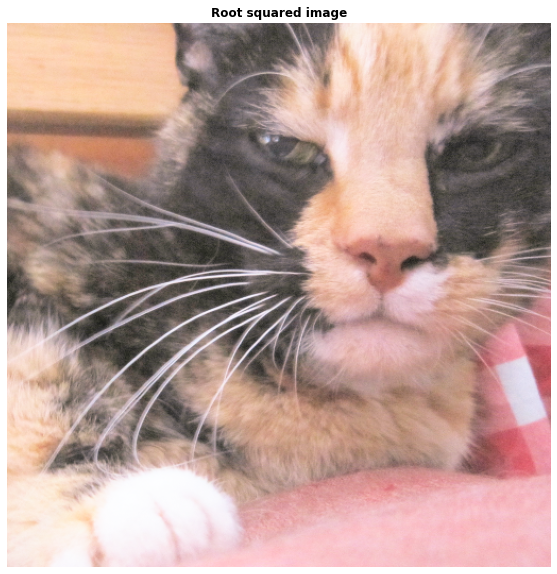

In [ ]:
plt.figure(figsize = (15,10))
plt.imshow(yiq_to_rgb(img_root_squared_yiq))
plt.title('Root squared image', fontweight='bold')
plt.axis('off')
plt.show()

### Filtro lineal

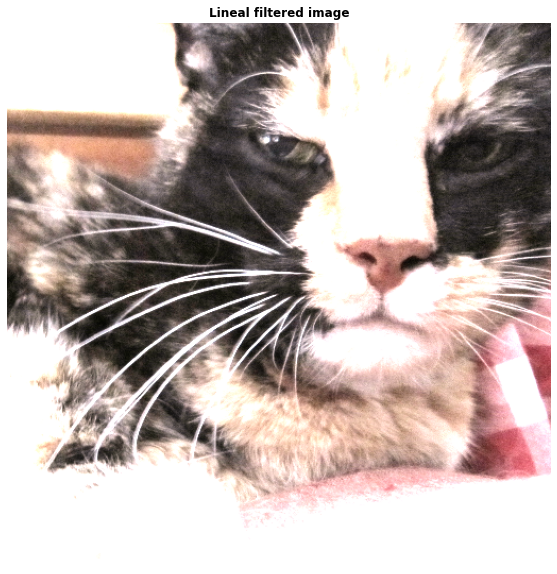

In [ ]:
plt.figure(figsize = (15,10))
plt.imshow(yiq_to_rgb(img_lineal_filter_yiq))
plt.title('Lineal filtered image', fontweight='bold')
plt.axis('off')
plt.show()

# Ejercicio 2.1
Implementar un aplicativo o notebook que levante una imagen en nivel de gris (o que la convierta a YIQ y retenga solo el Y) y aplique el filtrado por convolución aquí visto:
1. Pasabajos: Plano, Bartlett 3x3, Gaussiano 5x5.
2. Detectores de bordes: Laplaciano v4, Sobel 4 orientaciones.
3. Pasabanda.

Respecto del “cierre” de la imagen cerca de los bordes, implementar la técnica no ma- temáticamente perfecta de “repetir” artificialmente filas o columnas cuando estas hagan falta. Por ejemplo, si el kernel es 3x3 y estoy en la primera columna, y no hay ninguna columna a la izquierda, entonces repito la primera columna como si estuviese en la imagen original.

In [ ]:
import cv2 
from matplotlib import pyplot as plt
import numpy as np
import imageio


En primer lugar, definimos la función normalizadora y las funciones de conversión como lo hicimos en el ejercicio 1.1

In [ ]:
def normalize(x):
    """
    Normalize a list of sample image data in the range of 0 to 1
    : x: List of image data.  The image shape is (32, 32, 3)
    : return: Numpy array of normalized data
    """
    return np.array((x - np.min(x)) / (np.max(x) - np.min(x)))

# Función de conversión de RGB -> YIQ
RGB_TO_YIQ_MATRIX = np.array([[ 0.299, 0.587, 0.114], 
                          [ 0.595716, -0.274453, -0.321263], 
                          [ 0.211456, -0.522591, 0.311135]])
def rgb_to_yiq(img):
    yiq_img =  np.zeros((len(img),len(img[0]),len(img[0][0])))
    for i in range(len(img)):
        for j in range(len(img[i])):
            yiq_img[i][j] = RGB_TO_YIQ_MATRIX.dot(img[i][j])
    return yiq_img


# Función de conversión de YIQ -> RGB
YIQ_TO_RGB_MATRIX = np.array([[1, 0.9663, 0.6210], 
                          [1, -0.2721, -0.6474], 
                          [1, -1.1070, 1.7046]])
def yiq_to_rgb(img):
    rgb_image =  np.zeros((len(img),len(img[0]),len(img[0][0])))
    for i in range(len(img)):
        for j in range(len(img[i])):
            rgb_image[i][j] = YIQ_TO_RGB_MATRIX.dot(img[i][j])
    return rgb_image

def get_y_values_of_an_image(img):
    y_img = np.zeros((len(img),len(img[0])))
    for i in range(len(img)):
        for j in range(len(img[i])):
            y_img[i][j] = img[i][j][0]
    return y_img


def fill_i_and_q_values_of_an_y_img(y_img):
    yiq_image =  np.zeros((len(y_img),len(y_img[0]), 3))
    for i in range(len(y_img)):
        for j in range(len(y_img[i])):
            yiq_image[i][j][0] = y_img[i][j]
            yiq_image[i][j][1] = 0
            yiq_image[i][j][2] = 0
    return yiq_image


Continuamos trabajando con la imagen del ejercicio anterior

In [ ]:
def open_img(path):
    imageToConvert = cv2.imread(path)
    return cv2.cvtColor(imageToConvert, cv2.COLOR_BGR2RGB)

In [ ]:
img_21 = imageio.imread('imageio:wikkie.png')
normalized_img = normalize(img_21)
yiq_img = rgb_to_yiq(normalized_img)
y_img = get_y_values_of_an_image(yiq_img)

Imageio: 'wikkie.png' was not found on your computer; downloading it now.
Try 1. Download from https://github.com/imageio/imageio-binaries/raw/master/images/wikkie.png (461 kB)
Downloading: 8192/472047 bytes (1.7%)472047/472047 bytes (100.0%)
  Done
File saved as /root/.imageio/images/wikkie.png.


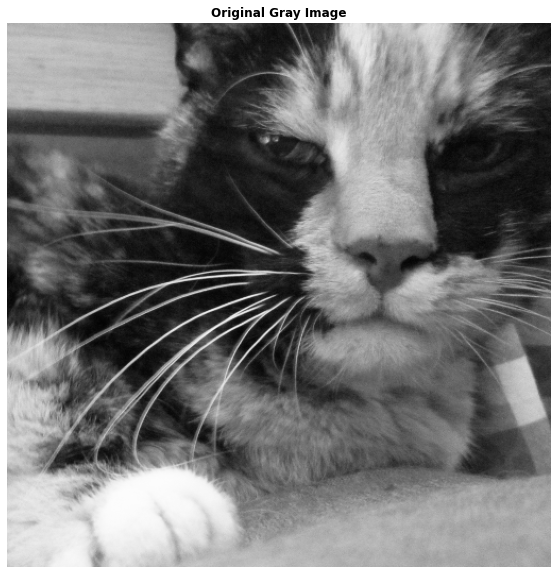

In [ ]:
plt.figure(figsize = (15,10))
plt.imshow(yiq_to_rgb(fill_i_and_q_values_of_an_y_img(y_img)))
plt.axis('off')
plt.title('Original Gray Image', fontweight='bold')
plt.show()

##**1. Pasabajos**

### PLANO

In [ ]:
FLAT_FILTER = np.array([[ 1, 1, 1], 
                    [ 1, 1, 1], 
                    [ 1, 1, 1]])

def apply_kernel_to_img(gray_img, kernel):
    img_filtered =  np.zeros((len(gray_img),len(gray_img[0])))
    extra_border = 0
    if len(kernel) == 3:
        extra_border = 1 
    elif len(kernel) == 5:
        extra_border = 2
    gray_img = cv2.copyMakeBorder(gray_img, extra_border, extra_border, extra_border, extra_border, cv2.BORDER_REFLECT);
    for i in range(extra_border, len(gray_img) - extra_border):
        for j in range(extra_border, len(gray_img[i]) - extra_border):
            aux_img = gray_img[i - extra_border:i + extra_border + 1, j - extra_border:j + extra_border + 1]
            k = (aux_img * kernel).sum() / kernel.sum()
            img_filtered[i-extra_border][j-extra_border] = k
    return img_filtered

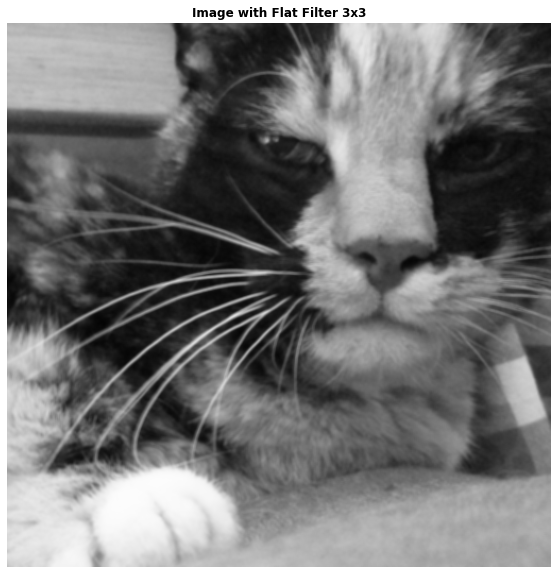

In [ ]:
flat_img_filtered = apply_kernel_to_img(y_img, FLAT_FILTER)
plt.figure(figsize = (15,10))
plt.imshow(yiq_to_rgb(fill_i_and_q_values_of_an_y_img(flat_img_filtered)))
plt.axis('off')
plt.title('Image with Flat Filter 3x3', fontweight='bold')
plt.show()

### BARTLETT

In [ ]:
BARTLETT_FILTER = np.array([[ 1, 2, 1], 
                    [ 2, 4, 2], 
                    [ 1, 2, 1]])
    
def apply_zero_gain_kernel_to_img(gray_img, kernel):
    img_filtered =  np.zeros((len(gray_img),len(gray_img[0])))
    extra_border = 0
    if len(kernel) == 3:
        extra_border = 1 
    elif len(kernel) == 5:
        extra_border = 2
    gray_img = cv2.copyMakeBorder(gray_img, extra_border, extra_border, extra_border, extra_border, cv2.BORDER_REFLECT);
    for i in range(extra_border, len(gray_img) - extra_border):
        for j in range(extra_border, len(gray_img[i]) - extra_border):
            aux_img = gray_img[i - extra_border:i + extra_border + 1, j - extra_border:j + extra_border + 1]
            k = (aux_img * kernel).sum()
            img_filtered[i-extra_border][j-extra_border] = k
    return img_filtered

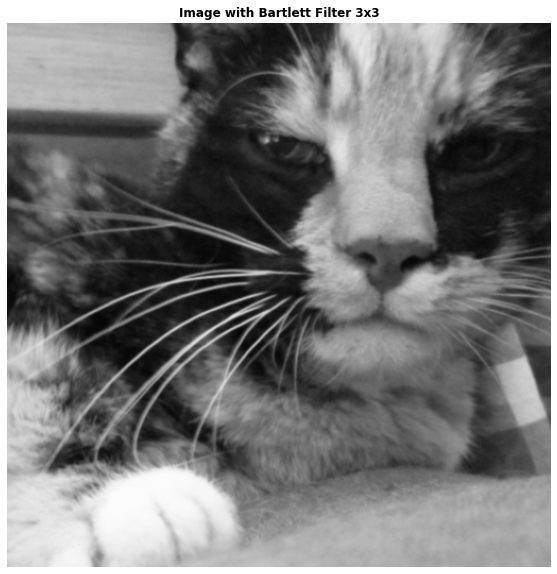

In [ ]:
bartlett_img_filtered = apply_kernel_to_img(y_img, BARTLETT_FILTER)
plt.figure(figsize = (15,10))
plt.imshow(yiq_to_rgb(fill_i_and_q_values_of_an_y_img(bartlett_img_filtered)))
plt.axis('off')
plt.title('Image with Bartlett Filter 3x3', fontweight='bold')
plt.show()

Puede observarse que la imagen está un poco más borrosa o difuminada.

### GAUSSIANO

In [ ]:
def gaussian_kernel(win_size, sigma):
    t = np.arange(win_size)
    x, y = np.meshgrid(t, t)
    o = (win_size - 1) / 2
    r = np.sqrt((x - o)**2 + (y - o)**2)
    scale = 1 / (sigma**2 * 2 * np.pi)
    return scale * np.exp(-0.5 * (r / sigma)**2)

GAUSSIAN_FILTER = gaussian_kernel(win_size=5, sigma=1)

print(GAUSSIAN_FILTER)

[[0.00291502 0.01306423 0.02153928 0.01306423 0.00291502]
 [0.01306423 0.05854983 0.09653235 0.05854983 0.01306423]
 [0.02153928 0.09653235 0.15915494 0.09653235 0.02153928]
 [0.01306423 0.05854983 0.09653235 0.05854983 0.01306423]
 [0.00291502 0.01306423 0.02153928 0.01306423 0.00291502]]


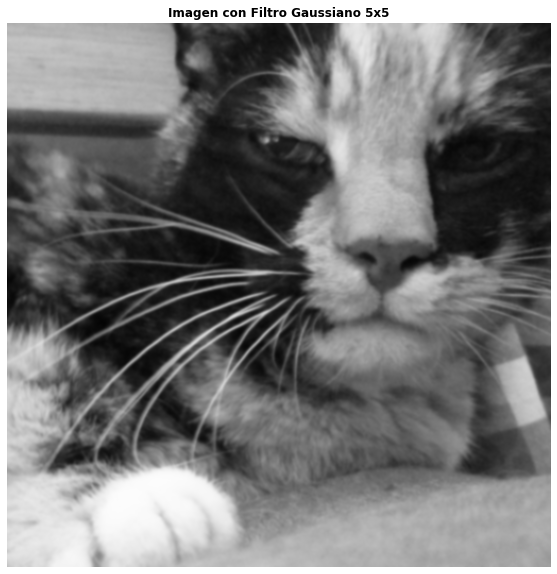

In [ ]:
gaussian_img_filtered = apply_kernel_to_img(y_img, GAUSSIAN_FILTER)
plt.figure(figsize = (15,10))
plt.imshow(yiq_to_rgb(fill_i_and_q_values_of_an_y_img(gaussian_img_filtered)))
plt.axis('off')
plt.title('Imagen con Filtro Gaussiano 5x5', fontweight='bold')
plt.show()

##**2. Detectores de borde**

### DETECTOR DE BORDE LAPLACIANO

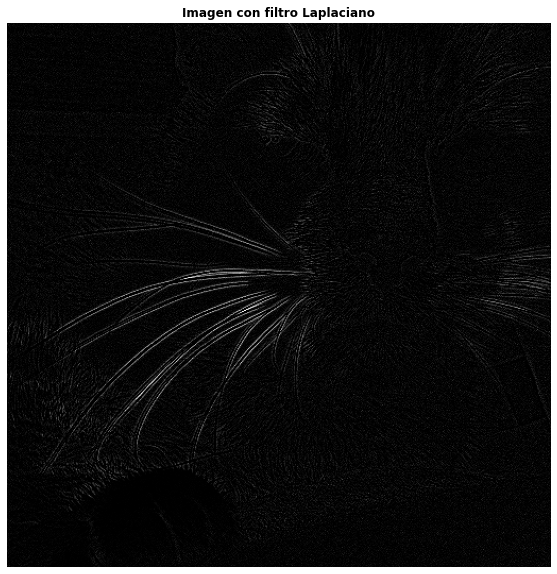

In [ ]:
# construct the Laplacian kernel used to detect edge-like
# regions of an image
LAPLACIAN_FILTER = np.array((
                    [0, 1, 0],
                    [1, -4, 1],
                    [0, 1, 0]), dtype="int")

laplacian_img_filtered = apply_zero_gain_kernel_to_img(y_img, LAPLACIAN_FILTER)

for i in range(len(laplacian_img_filtered)):
        for j in range(len(laplacian_img_filtered[i])):
            if laplacian_img_filtered[i][j] > 1:
                laplacian_img_filtered[i][j] = 1
            elif laplacian_img_filtered[i][j] < 0:
                laplacian_img_filtered[i][j] = 0
                      
plt.figure(figsize = (15,10))
plt.imshow(yiq_to_rgb(fill_i_and_q_values_of_an_y_img(laplacian_img_filtered)))
plt.axis('off')
plt.title('Imagen con filtro Laplaciano', fontweight='bold')
plt.show()

Puede observarse que se realzan las aristas. En este caso particular puede verse que en los bigotes del gato se concentra la mayor definición, ya que es la seccióon de la imagen con aristas más marcadas. 

### DETECTOR DE BORDE SOBEL, 4 ORIENTACIONES

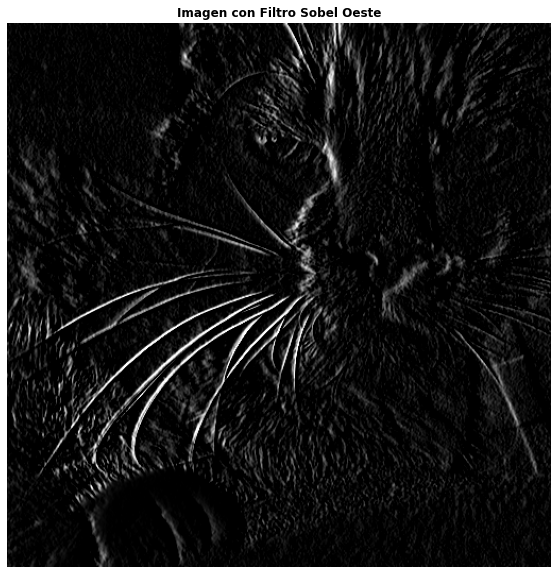

In [ ]:
#Se realiza una prueba con el FILTRO SOBEL OESTE

SOBEL_FILTER = np.array([[ -1, 0, 1], 
                        [ -2, 0, 2], 
                        [ -1, 0, 1]])
sobel_west_img_filtered = apply_zero_gain_kernel_to_img(y_img, SOBEL_FILTER)
plt.figure(figsize = (15,10))
plt.imshow(yiq_to_rgb(fill_i_and_q_values_of_an_y_img(sobel_west_img_filtered)))
plt.axis('off')
plt.title('Imagen con Filtro Sobel Oeste', fontweight='bold')
plt.show()

Para esta imagen en particular se puede observar que el filtro Sobel define mucho mejor las aristas. No solo realza los bigotes, sino además el pelaje del animal, que es borroso.

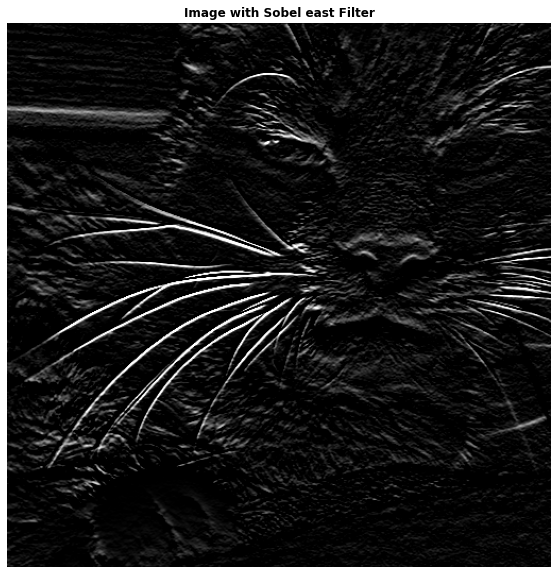

In [ ]:
#Se realiza una prueba con el FILTRO SOBEL ESTE

sobel_east_img_filtered = apply_zero_gain_kernel_to_img(y_img, np.rot90(SOBEL_FILTER))
plt.figure(figsize = (15,10))
plt.imshow(yiq_to_rgb(fill_i_and_q_values_of_an_y_img(sobel_east_img_filtered)))
plt.axis('off')
plt.title('Image with Sobel east Filter', fontweight='bold')
plt.show()

Con este filtro se logra mayor definición en la zona del ocico del gato.

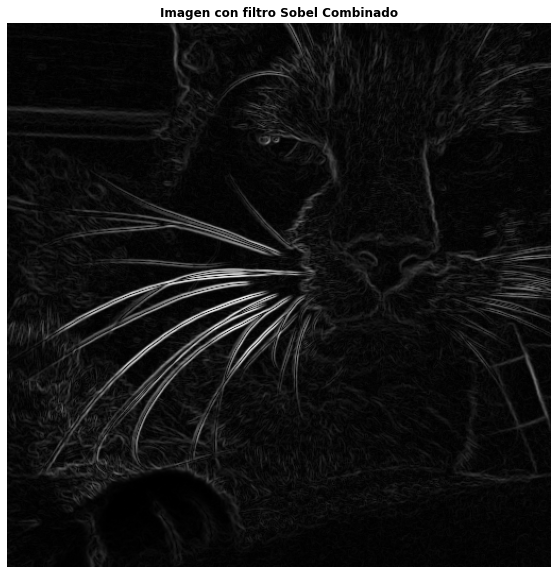

In [ ]:
#Se realiza una prueba con el FILTRO SOBEL COMBINADO

gradient_mag = np.sqrt(np.square(sobel_west_img_filtered) + np.square(sobel_east_img_filtered))
gradient_mag = gradient_mag/ gradient_mag.max()
plt.figure(figsize = (15,10))
plt.imshow(yiq_to_rgb(fill_i_and_q_values_of_an_y_img(gradient_mag)))
plt.axis('off')
plt.title('Imagen con filtro Sobel Combinado', fontweight='bold')
plt.show()

En el caso del filtro SOBEL COMBINADO se logra mayor definición.

##**3. Pasabanda**

In [ ]:
import cv2
img = cv2.imread('D:/downloads/opencv_logo.PNG')



#Primero obtenemos la matriz del filtro GAUSSIANO (5x5)

print(GAUSSIAN_FILTER)

#Luego obtenemos la matriz del filtro BARTLETT (3X3)

print(BARTLETT_FILTER)

#Debido a que contamos con dos matrices de distinto orden debemos realizar una transformación sobre el filtro BARTLETT

BARTLETT_FILTER5X5 = np.pad(BARTLETT_FILTER,(1,1), 'constant', constant_values=0)

print(BARTLETT_FILTER5X5)

# Ahora si podemos realizar la resta
dog_img = GAUSSIAN_FILTER - BARTLETT_FILTER5X5 

print(dog_img)

[[0.00291502 0.01306423 0.02153928 0.01306423 0.00291502]
 [0.01306423 0.05854983 0.09653235 0.05854983 0.01306423]
 [0.02153928 0.09653235 0.15915494 0.09653235 0.02153928]
 [0.01306423 0.05854983 0.09653235 0.05854983 0.01306423]
 [0.00291502 0.01306423 0.02153928 0.01306423 0.00291502]]
[[1 2 1]
 [2 4 2]
 [1 2 1]]
[[0 0 0 0 0]
 [0 1 2 1 0]
 [0 2 4 2 0]
 [0 1 2 1 0]
 [0 0 0 0 0]]
[[ 2.91502447e-03  1.30642333e-02  2.15392793e-02  1.30642333e-02
   2.91502447e-03]
 [ 1.30642333e-02 -9.41450168e-01 -1.90346765e+00 -9.41450168e-01
   1.30642333e-02]
 [ 2.15392793e-02 -1.90346765e+00 -3.84084506e+00 -1.90346765e+00
   2.15392793e-02]
 [ 1.30642333e-02 -9.41450168e-01 -1.90346765e+00 -9.41450168e-01
   1.30642333e-02]
 [ 2.91502447e-03  1.30642333e-02  2.15392793e-02  1.30642333e-02
   2.91502447e-03]]


In [ ]:
# Kernels para filtrado por convolución: Pasabanda
# gaussiano 5x5 menos gaussiano 3x3   
pasabanda=dog_img

In [ ]:
#Defino nuevas funciones para realizar la convolución. Se trabajará con el kernel resultante de restar FILTRO GAUSSIANO menos FILTRO BARTLETT

def rgb2yiq(rgb):
    """Transforma un conjunto de píxeles RGB en YIQ
    """
    matrix = np.array([
        [0.299,     0.587,     0.114   ], 
        [0.595716, -0.274453, -0.321263],
        [0.211456, -0.522591,  0.311135]
    ])
    return np.dot(rgb, matrix)

def yiq2rgb(yiq):
    """Transforma un conjunto de píxeles YIQ en RGB
    """
    matrix = np.array([
        [1,  0.9663,  0.621 ], 
        [1, -0.2721, -0.6474],
        [1, -1.1070,  1.7046]
    ])
    return np.dot(yiq, matrix)

def denormalizeRGB(rgb):
    """Desnormaliza los valores RGB en [0,1]
    """
    return (rgb * 255).round()

def plot_img(img, cmap=None):
    """Mostrar imagen
    """
    fig, ax = plt.subplots()
    try:
        if cmap is not None:
            ax.imshow(img, cmap=cmap)
        else:
            ax.imshow(img)
    except:
        print("colormap no válido")
    plt.axis('off')
    plt.show()


def convol(image, Kernel=None):
    #1) Pasar de RGB a YIQ, conservar solo la capa Y
    normalized_rgb = img_2
    yiq_pixels = rgb2yiq(normalized_rgb)

    # Y: Nos quedamos solamente con la capa de luminancia para hacer el 
    # filtrado, luego recupero las otras dos capas como están para mostrar la
    # imagen
    y_image=yiq_pixels[:, :, 0] 

    #2) Filtrado posible
    if Kernel=="pasabanda":
        K=pasabanda
    
    #3) Convolución
    (iH,iW)=y_image.shape
    (kH,kW)=K.shape
    pad=(kW-1)//2
    y_image=cv2.copyMakeBorder(y_image,pad,pad,pad,pad,cv2.BORDER_REPLICATE)
    y_salida=np.zeros((iH,iW),dtype="float")
    for y in np.arange(pad,iH+pad):
        for x in np.arange(pad,iW+pad):
            roi=y_image[y-pad:y+pad+1,x-pad:x+pad+1]
            k=(roi*K).sum()
            y_salida[y-pad,x-pad]=k
  
    #4) una vez completo el filtrado, compilo nuevamente el NDArray de YIQ
    yiq_pixels_mod=np.empty(yiq_pixels.shape)
    yiq_pixels_mod[:,:,0]=y_salida
    yiq_pixels_mod[:, :, 1]=yiq_pixels[:, :, 1]  #Son las capas de IQ que hay que sumarle a y_mod
    yiq_pixels_mod[:, :, 2]=yiq_pixels[:, :, 2]

    #4) Chequear los rangos del YIQ modificado
    yiq_pixels_mod[:, :, 0] = np.where(yiq_pixels_mod[:, :, 0] <= 1, yiq_pixels_mod[:, :, 0], 1)

    #5) Y’I’Q’ -> R’G’B’ (el RGB normalizado del pixel procesado)
    new_pixels = yiq2rgb(yiq_pixels_mod)
    new_image = denormalizeRGB(new_pixels)
    # plot_img(new_image)
    plot_img(y_salida, cmap="gray")

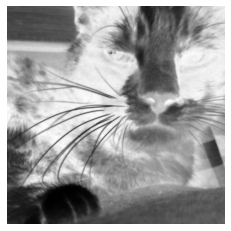

In [ ]:
convol(img,"pasabanda")

#Ejercicio 2.2
Desarrollar un aplicativo o notebook que implemente los conceptos de morfología en niveles de gris aquí descriptos, con un elemento estructurante 3x3. El mismo incluirá las siguientes funciones:
- Erosión (tomar el mínimo valor de luminancia de la vecindad).
- Dilatación (máximo)
- Apertura, cierre, borde morfológico
- Mediana
- Top-hat

Incluir la capacidad de copiar la componente de la imagen procesada en la componente original, para poder aplicar dos o más filtrados en secuencia.

### Erosión

In [ ]:
def erode_img(gray_img, kernel_size):
    img_filtered =  np.zeros((len(gray_img),len(gray_img[0])))
    extra_border = 0
    if kernel_size == 3:
        extra_border = 1 
    elif kernel_size == 5:
        extra_border = 2
    gray_img = cv2.copyMakeBorder(gray_img, extra_border, extra_border, extra_border, extra_border, cv2.BORDER_REFLECT);
    for i in range(extra_border, len(gray_img) - extra_border):
        for j in range(extra_border, len(gray_img[i]) - extra_border):
            aux_img = gray_img[i - extra_border:i + extra_border + 1, j - extra_border:j + extra_border + 1]
            img_filtered[i-extra_border][j-extra_border] = aux_img.min()
    return img_filtered

Imageio: 'coffee.png' was not found on your computer; downloading it now.
Try 1. Download from https://github.com/imageio/imageio-binaries/raw/master/images/coffee.png (441 kB)
Downloading: 8192/451102 bytes (1.8%)451102/451102 bytes (100.0%)
  Done
File saved as /root/.imageio/images/coffee.png.


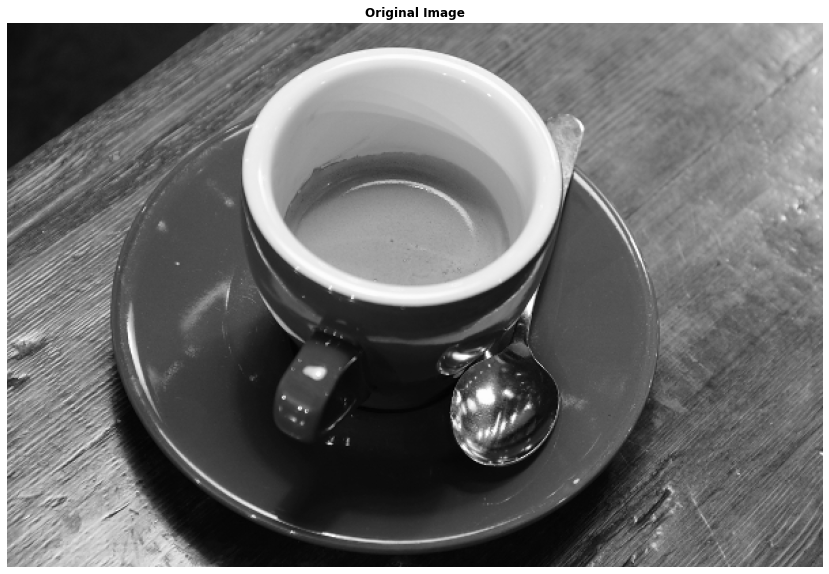

In [ ]:
img_22 = imageio.imread('imageio:coffee.png')
normalized_img = normalize(img_22)
yiq_img = rgb_to_yiq(normalized_img)
y_img = get_y_values_of_an_image(yiq_img)
plt.figure(figsize = (15,10))
plt.imshow(yiq_to_rgb(fill_i_and_q_values_of_an_y_img(y_img)))
plt.axis('off')
plt.title('Original Image', fontweight='bold')
plt.show()

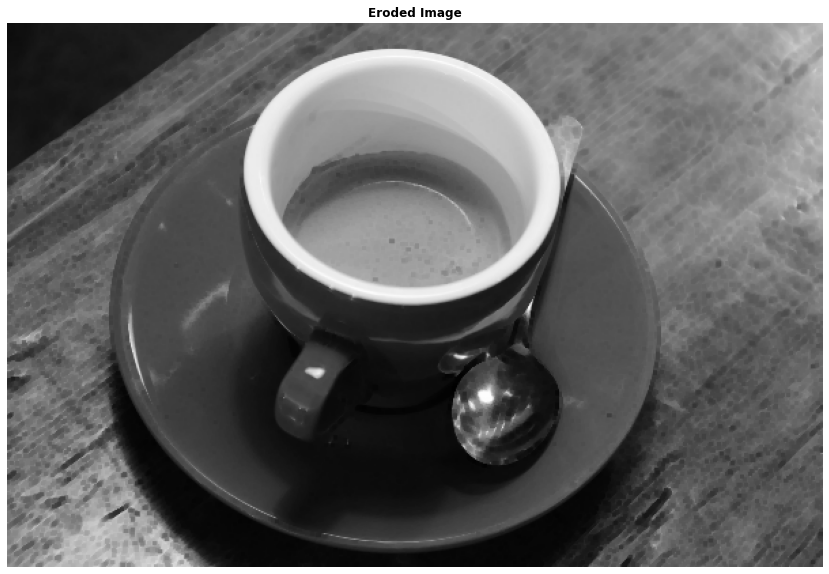

In [ ]:
eroded_img = erode_img(y_img, 3)
plt.figure(figsize = (15,10))
plt.imshow(yiq_to_rgb(fill_i_and_q_values_of_an_y_img(eroded_img)))
plt.axis('off')
plt.title('Eroded Image', fontweight='bold')
plt.show()

### Dilatación

In [ ]:
def dilate_img(gray_img, kernel_size):
    img_filtered =  np.zeros((len(gray_img),len(gray_img[0])))
    extra_border = 0
    if kernel_size == 3:
        extra_border = 1 
    elif kernel_size == 5:
        extra_border = 2
    gray_img = cv2.copyMakeBorder(gray_img, extra_border, extra_border, extra_border, extra_border, cv2.BORDER_REFLECT);
    for i in range(extra_border, len(gray_img) - extra_border):
        for j in range(extra_border, len(gray_img[i]) - extra_border):
            aux_img = gray_img[i - extra_border:i + extra_border + 1, j - extra_border:j + extra_border + 1]
            img_filtered[i-extra_border][j-extra_border] = aux_img.max()
    return img_filtered

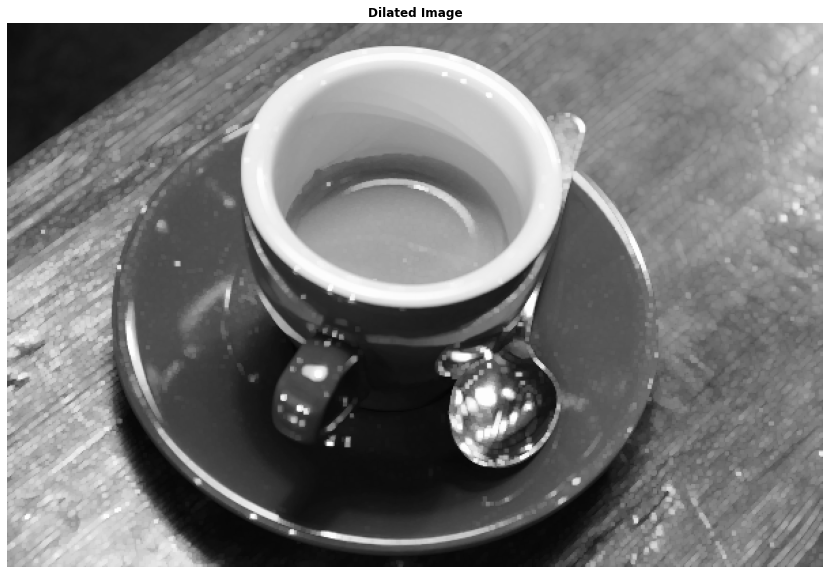

In [ ]:
dilated_img = dilate_img(y_img, 3)
plt.figure(figsize = (15,10))
plt.imshow(yiq_to_rgb(fill_i_and_q_values_of_an_y_img(dilated_img)))
plt.axis('off')
plt.title('Dilated Image', fontweight='bold')
plt.show()

### Apertura, cierre, borde morfológico

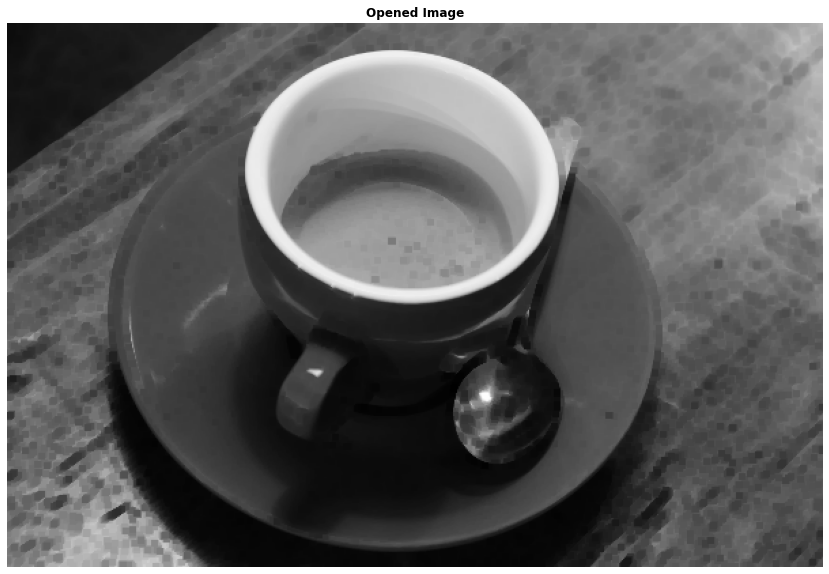

In [ ]:
# Apertura
opened_img = dilate_img(eroded_img, 3)
plt.figure(figsize = (15,10))
plt.imshow(yiq_to_rgb(fill_i_and_q_values_of_an_y_img(opened_img)))
plt.axis('off')
plt.title('Opened Image', fontweight='bold')
plt.show()

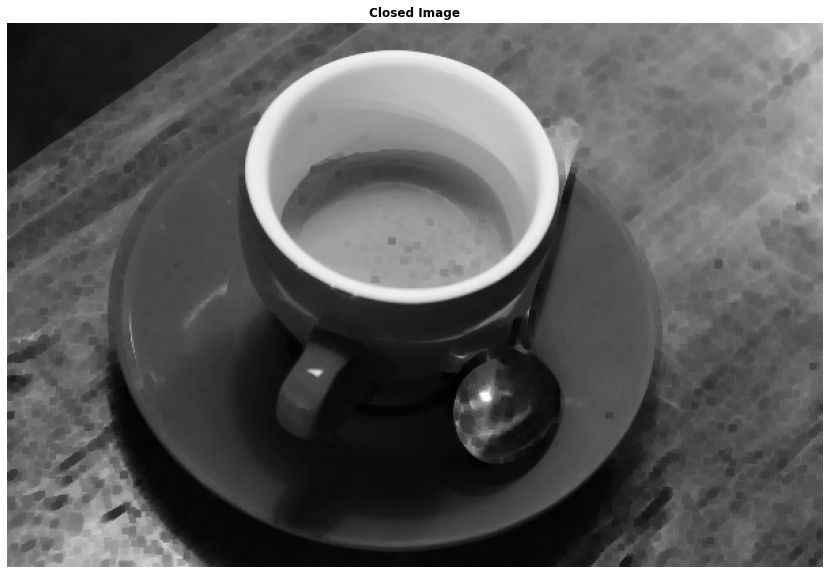

In [ ]:
# Cierre
closed_image = erode_img(dilated_img, 3)
plt.figure(figsize = (15,10))
plt.imshow(yiq_to_rgb(fill_i_and_q_values_of_an_y_img(closed_image)))
plt.axis('off')
plt.title('Closed Image', fontweight='bold')
plt.show()

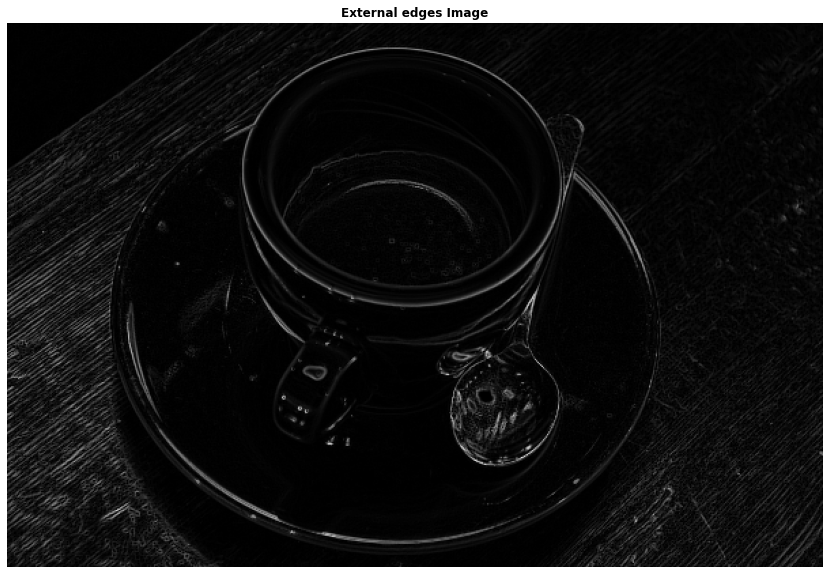

In [ ]:
# Borde
edge_img = y_img - eroded_img  # y_img is the original image.
plt.figure(figsize = (15,10))
plt.imshow(yiq_to_rgb(fill_i_and_q_values_of_an_y_img(edge_img)))
plt.axis('off')
plt.title('External edges Image', fontweight='bold')
plt.show()

### Mediana

In [ ]:
def median_img_filter(gray_img, kernel_size):
    img_filtered =  np.zeros((len(gray_img),len(gray_img[0])))
    extra_border = 0
    if kernel_size == 3:
        extra_border = 1 
    elif kernel_size == 5:
        extra_border = 2
    gray_img = cv2.copyMakeBorder(gray_img, extra_border, extra_border, extra_border, extra_border, cv2.BORDER_REFLECT);
    for i in range(extra_border, len(gray_img) - extra_border):
        for j in range(extra_border, len(gray_img[i]) - extra_border):
            aux_img = gray_img[i - extra_border:i + extra_border + 1, j - extra_border:j + extra_border + 1]
            img_filtered[i-extra_border][j-extra_border] =  np.median(aux_img)
    return img_filtered

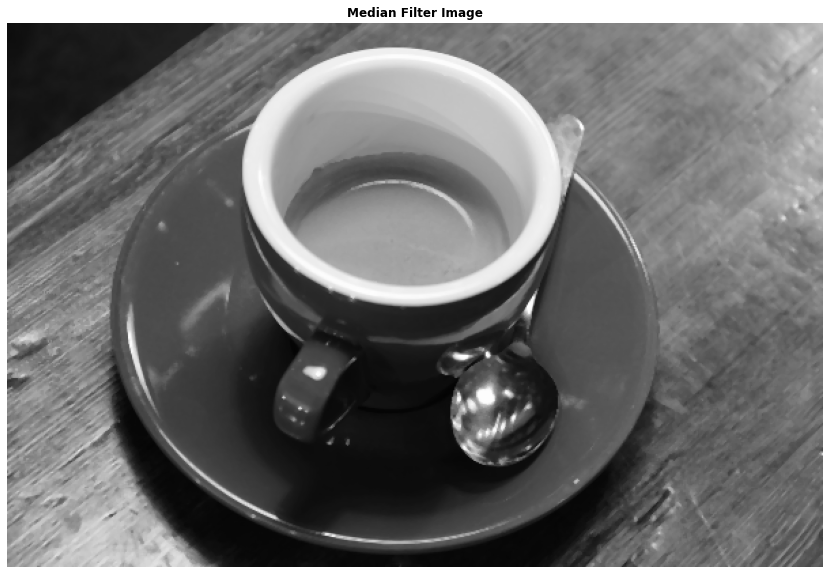

In [ ]:
median_img = median_img_filter(y_img, 3)
plt.figure(figsize = (20,10))
plt.imshow(yiq_to_rgb(fill_i_and_q_values_of_an_y_img(median_img)))
plt.axis('off')
plt.title('Median Filter Image', fontweight='bold')
plt.show()

### Top-hat

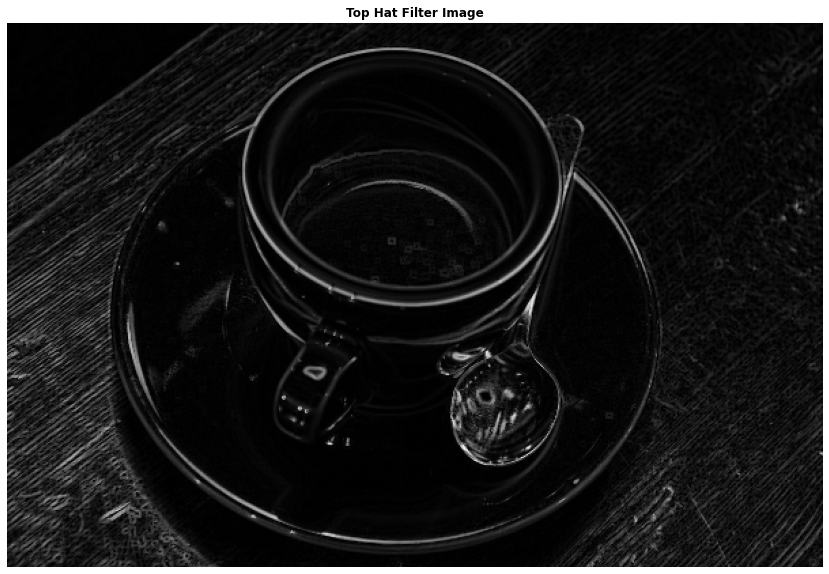

In [ ]:
top_hat_img = y_img - opened_img # y_img is the original image.
plt.figure(figsize = (15,10))
plt.imshow(yiq_to_rgb(fill_i_and_q_values_of_an_y_img(top_hat_img)))
plt.axis('off')
plt.title('Top Hat Filter Image', fontweight='bold')
plt.show()

# Ejercicios Optativos. Ver presentación para más detalle
Recordá que hay ejercicios opcionales especificados en la presentación correspondiente al trabajo práctico.